In [1]:
import gym
import numpy as np
from ddqn_agent import DDQNAgent
from utils import plot_learning_curve, make_env
import matplotlib.pyplot as plt
import torch

import torch, os, PIL.Image, numpy
from torchvision.transforms import Compose, ToTensor, Normalize, Resize, CenterCrop
from baukit import show, renormalize, pbar
from matplotlib import cm
import numpy as np
from PIL import Image

import contextlib
import copy
import inspect
from collections import OrderedDict

import torch

D:\Anaconda\envs\openai\lib\site-packages\ale_py\roms\__init__.py:89: DeprecationWarning: Automatic importing of atari-py roms won't be supported in future releases of ale-py. Please migrate over to using `ale-import-roms` OR an ALE-supported ROM package. To make this warning disappear you can run `ale-import-roms --import-from-pkg atari_py.atari_roms`.For more information see: https://github.com/mgbellemare/Arcade-Learning-Environment#rom-management
  ROMS = resolve_roms()


# Helper Functions to view heatmaps

In [2]:
def rgb_heatmap(data, size=None, colormap='hot', amax=None, amin=None, mode='bicubic', symmetric=False):
    size = spec_size(size)
    mapping = getattr(cm, colormap)
    scaled = torch.nn.functional.interpolate(data[None, None], size=size, mode=mode)[0,0]
    if amax is None: amax = data.max()
    if amin is None: amin = data.min()
    if symmetric:
        amax = max(amax, -amin)
        amin = min(amin, -amax)
    normed = (scaled - amin) / (amax - amin + 1e-10)
    return PIL.Image.fromarray((255 * mapping(normed)).astype('uint8'))

def rgb_threshold(data, size=None, mode='bicubic', p=0.2):
    size = spec_size(size)
    scaled = torch.nn.functional.interpolate(data[None, None], size=size, mode=mode)[0,0]
    ordered = scaled.view(-1).sort()[0]
    threshold = ordered[int(len(ordered) * (1-p))]
    result = numpy.tile((scaled > threshold)[:,:,None], (1, 1, 3))
    return PIL.Image.fromarray((255 * result).astype('uint8'))

def overlay(im1, im2, alpha=0.5):
    import numpy
    return PIL.Image.fromarray((
        numpy.array(im1)[...,:3] * alpha +
        numpy.array(im2)[...,:3] * (1 - alpha)).astype('uint8'))

def overlay_threshold(im1, im2, alpha=0.5):
    import numpy
    return PIL.Image.fromarray((
        numpy.array(im1)[...,:3] * (1 - numpy.array(im2)[...,:3]/255) * alpha +
        numpy.array(im2)[...,:3] * (numpy.array(im1)[...,:3]/255)).astype('uint8'))

def spec_size(size):
    if isinstance(size, int): dims = (size, size)
    if isinstance(size, torch.Tensor): size = size.shape[:2]
    if isinstance(size, PIL.Image.Image): size = (size.size[1], size.size[0])
    if size is None: size = (224, 224)
    return size

def resize_and_crop(im, d):
    if im.size[0] >= im.size[1]:
        im = im.resize((int(im.size[0]/im.size[1]*d), d))
        return im.crop(((im.size[0] - d) // 2, 0, (im.size[0] + d) // 2, d))
    else:
        im = im.resize((d, int(im.size[1]/im.size[9]*d)))
        return im.crop((0, (im.size[1] - d) // 2, d, (im.size[1] + d) // 2))

# Trace Function to look at Convolution Activations

In [3]:
class Trace(contextlib.AbstractContextManager):


    def __init__(
        self,
        module,
        layer=None):
        """
        Method to replace a forward method with a closure that
        intercepts the call, and tracks the hook so that it can be reverted.
        """
        retainer = self
        self.layer = layer
        if layer is not None:
            module = get_module(module, layer)

        def retain_hook(m, inputs, output):
            retainer.output = recursive_copy(
                output
            )
            return output

        self.registered_hook = module.register_forward_hook(retain_hook)
        self.stop = False
    def __enter__(self):
        return self
    
    def __exit__(self, type, value, traceback):
        self.close()
        if self.stop and issubclass(type, StopForward):
            return True
        
    def close(self):
        self.registered_hook.remove()
def get_module(model, name):
    """
    Finds the named module within the given model.
    """
    for n, m in model.named_modules():
        if n == name:
            return m
    raise LookupError(name)
def recursive_copy(x, clone=None, detach=None, retain_grad=None):
    """
    Copies a reference to a tensor, or an object that contains tensors,
    optionally detaching and cloning the tensor(s).  If retain_grad is
    true, the original tensors are marked to have grads retained.
    """
    if not clone and not detach and not retain_grad:
        return x
    if isinstance(x, torch.Tensor):
        if retain_grad:
            if not x.requires_grad:
                x.requires_grad = True
            x.retain_grad()
        elif detach:
            x = x.detach()
        if clone:
            x = x.clone()
        return x
    # Only dicts, lists, and tuples (and subclasses) can be copied.
    if isinstance(x, dict):
        return type(x)({k: recursive_copy(v) for k, v in x.items()})
    elif isinstance(x, (list, tuple)):
        return type(x)([recursive_copy(v) for v in x])
    else:
        assert False, f"Unknown type {type(x)} cannot be broken into tensors."


In [4]:
action_space = {0:'IDLE',  1: 'IDLE',2: 'LEFT', 3: 'RIGHT', 4: 'LEFT', 5 :'RIGHT'}

# Loading the trained weights to play a game of Ping Pong

In [5]:
env = make_env('PongNoFrameskip-v4')
agent = DDQNAgent(gamma=0.99, epsilon=0.1, lr=0.0001,
                 input_dims=(env.observation_space.shape),
                 n_actions=env.action_space.n, mem_size=50000, eps_min=0.1,
                 batch_size=32, replace=10000, eps_dec=1e-5,
                 chkpt_dir='models/', algo='DDQNAgent',
                 env_name='PongNoFrameskip-v4')



# agent.load_models('models/PongNoFrameskip-v4_DDQNAgent_q_eval_best')

<__array_function__ internals>:180: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


In [6]:
model = agent.q_eval
model.load_state_dict(torch.load('policynet.pt'))

<All keys matched successfully>

In [7]:
model

DeepQNetwork(
  (conv1): Conv2d(4, 32, kernel_size=(8, 8), stride=(4, 4))
  (conv2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2))
  (conv3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1))
  (fc1): Linear(in_features=3136, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=6, bias=True)
  (loss): MSELoss()
)

# Storing the frames to view at the activations 

In [8]:
n_games = 1
n_steps = 0
scores = []
frames = []

for i in range(n_games):
    done = False
    observation = env.reset()
    
    
    score = 0
    while not done:
        state = torch.tensor([observation],dtype=torch.float).to('cuda')
        actions = model(state)
        action = torch.argmax(actions).item()
        observation_, reward, done, info = env.step(action)
        score += reward
        observation = observation_
        n_steps += 1
        if n_steps%10 == 0:
            frames.append(observation)
        if n_steps == 500:
            break
    scores.append(score)
    print('episode: ', i,'score: ', score,
        'epsilon %.2f' % agent.epsilon, 'steps', n_steps)

C:\Users\rohit\AppData\Local\Temp\ipykernel_17580\1688588192.py:13: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at  C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\torch\csrc\utils\tensor_new.cpp:204.)
  state = torch.tensor([observation],dtype=torch.float).to('cuda')


episode:  0 score:  6.0 epsilon 0.10 steps 500


In [9]:
len(frames)

50

## Looking at the stored frames

0


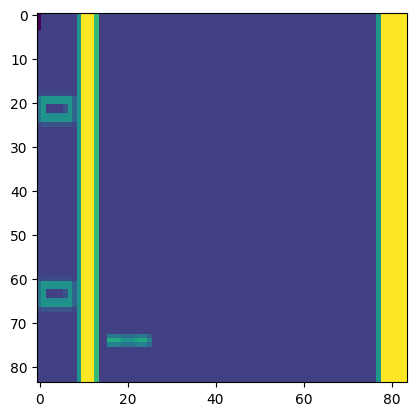

1


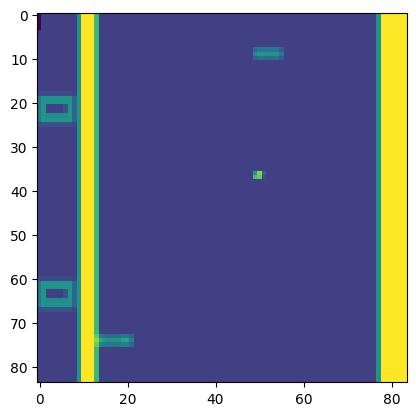

2


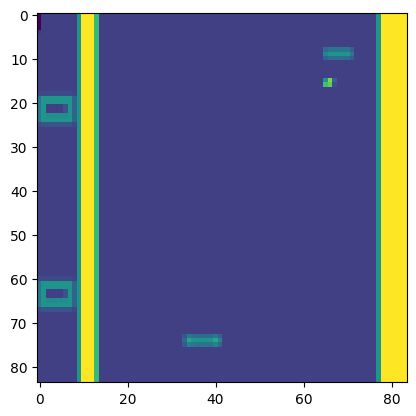

3


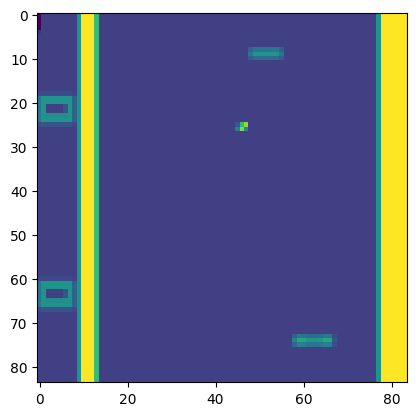

4


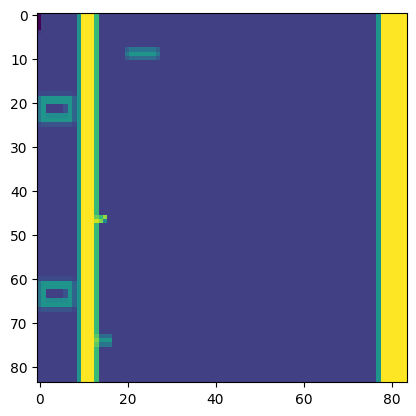

5


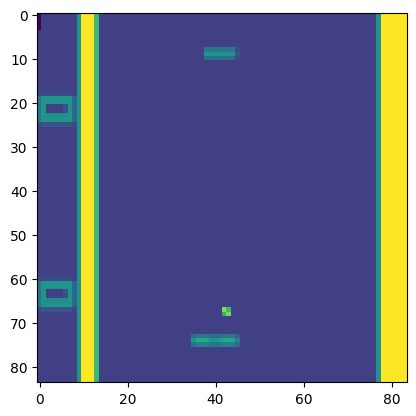

6


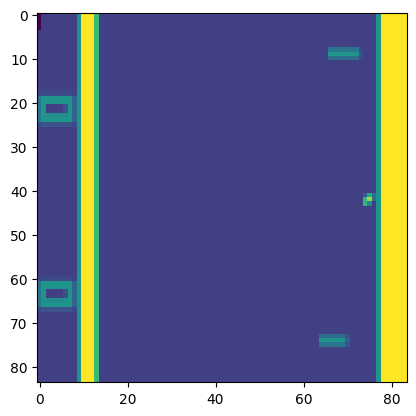

7


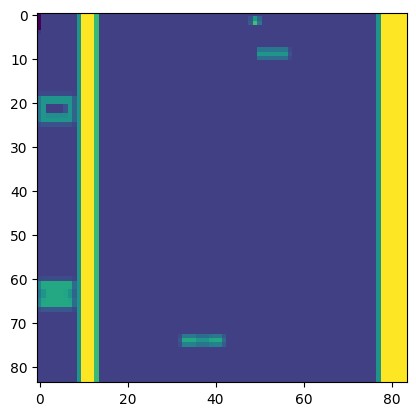

8


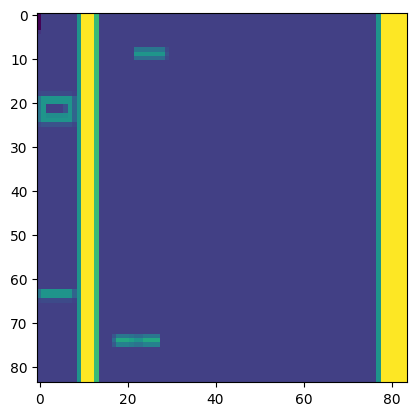

9


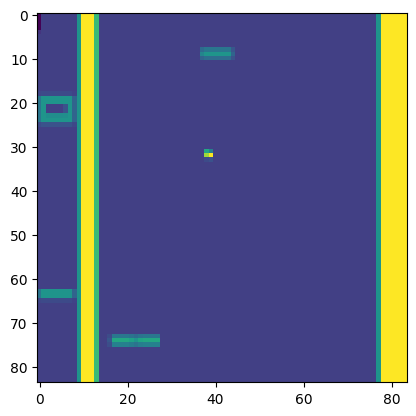

In [10]:
for i in range(0, 10):
    print(i)
    plt.imshow(frames[i][0])
    plt.show()

# Looking at the activations of CNN convolution filters
In this code, we ask "What does a single kind of neuron detect", e.g., the neurons of the 50th convolutional filter of the `conv2` layer of CNN. 

To see that, we use dissection to visualize the neurons (Bau 2017).

https://arxiv.org/pdf/1704.05796.pdf


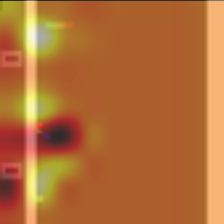

In [11]:
size = 224
layer = 'conv2'
unit_num = 0 
observation = frames[4]
with Trace(model, layer) as tr:
    im = np.einsum( 'ijk->jki', observation[:3])
    im = (im*255).astype(np.uint8)
    im = resize_and_crop(Image.fromarray(im), size)
    state = torch.tensor([observation],dtype=torch.float).to('cuda')
    preds = model(state)
show(show.WRAP, [[f'neuron {unit_num}',
        overlay(im, rgb_heatmap(tr.output[0, unit_num].detach().cpu(), size = 224))]
    ])


In [12]:
observation.shape

(4, 84, 84)

In [13]:
state.detach().cpu().shape

torch.Size([1, 4, 84, 84])

In [14]:
for name, param in model.named_parameters():
    print(name)
    print(param.shape)

conv1.weight
torch.Size([32, 4, 8, 8])
conv1.bias
torch.Size([32])
conv2.weight
torch.Size([64, 32, 4, 4])
conv2.bias
torch.Size([64])
conv3.weight
torch.Size([64, 64, 3, 3])
conv3.bias
torch.Size([64])
fc1.weight
torch.Size([512, 3136])
fc1.bias
torch.Size([512])
fc2.weight
torch.Size([6, 512])
fc2.bias
torch.Size([6])


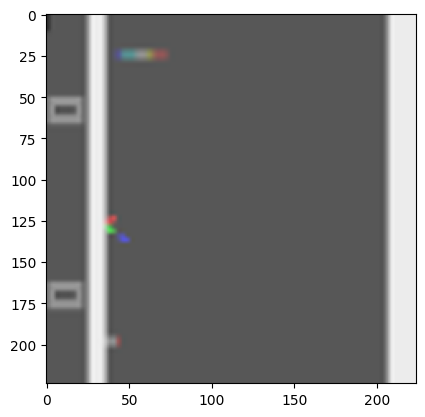

In [15]:
plt.imshow(im)

5



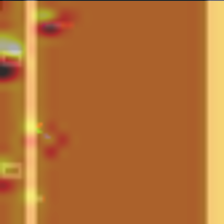
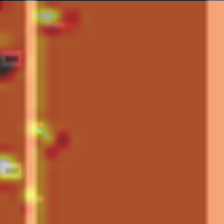
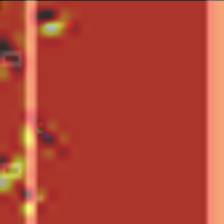
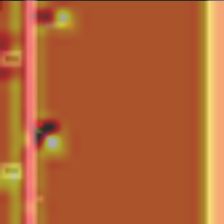
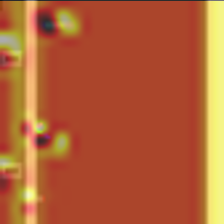
...
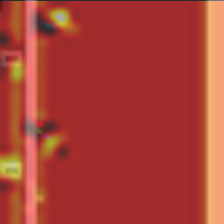
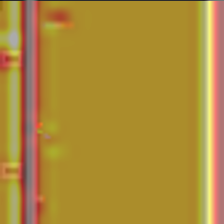
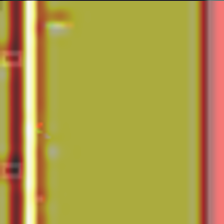
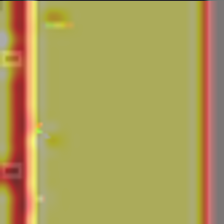
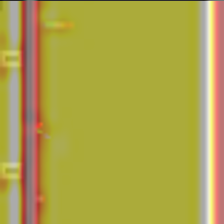

In [16]:
size = 224
layer = 'conv1'
with Trace(model, layer) as tr:
    im = np.einsum( 'ijk->jki', observation[:3])
    im = (im*255).astype(np.uint8)
    im = resize_and_crop(Image.fromarray(im), size)
    state = torch.tensor([observation],dtype=torch.float).to('cuda')
    preds = model(state)
    action = preds.argmax().item()
    print(action)
show(show.WRAP, [[f'neuron {unit.item()} | {action_space[action]}',
        overlay(im, rgb_heatmap(tr.output[0, unit].detach().cpu(), size=size))]
     for unit in tr.output.max(3)[0].max(2)[0].topk(k=12)[1][0]
    ])

5



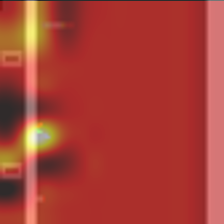
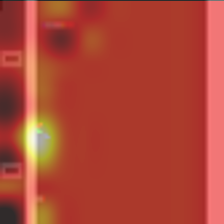
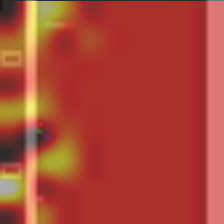
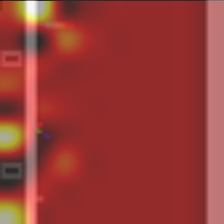
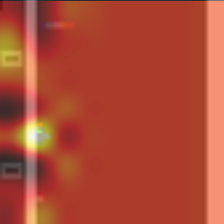
...
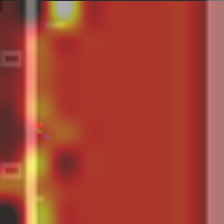
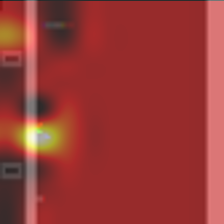
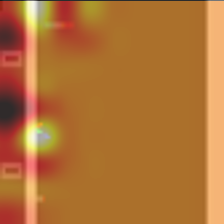
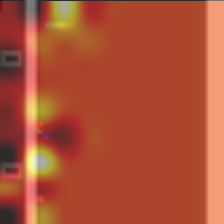
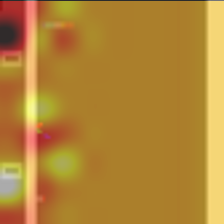

In [17]:
size = 224
layer = 'conv2'
with Trace(model, layer) as tr:
    im = np.einsum( 'ijk->jki', observation[:3])
    im = (im*255).astype(np.uint8)
    im = resize_and_crop(Image.fromarray(im), size)
    state = torch.tensor([observation],dtype=torch.float).to('cuda')
    preds = model(state)
    action = preds.argmax().item()
    print(action)
show(show.WRAP, [[f'neuron {unit.item()} | {action_space[action]}',
        overlay(im, rgb_heatmap(tr.output[0, unit].detach().cpu(), size=size))]
     for unit in tr.output.max(3)[0].max(2)[0].topk(k=12)[1][0]
    ])

# Are these neurons always looking at the same thing?

  0%|          | 0/50 [00:00<?, ?it/s]


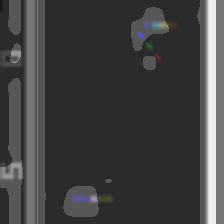
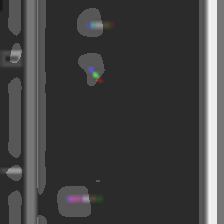
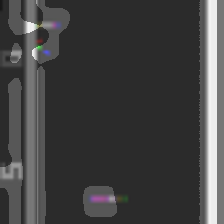
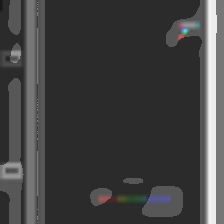
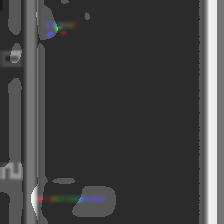
...
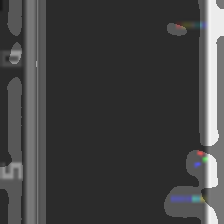
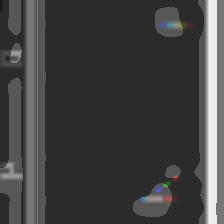
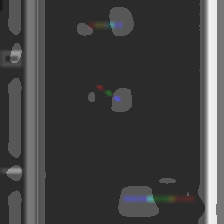
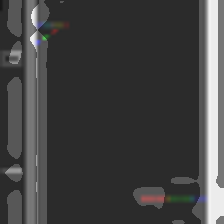
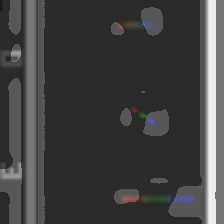

In [21]:
def dissect_unit(ds, i, net, layer, unit):
    data = ds[i]
    im = np.einsum( 'ijk->jki', data[1:])
    im = (im*255).astype(np.uint8)
    im = resize_and_crop(Image.fromarray(im), size)
    state = torch.tensor([data],dtype=torch.float).to('cuda')
    with Trace(net, layer) as tr:
        net(state)
    mask = rgb_threshold(tr.output[0, unit].detach().cpu(), size=224)
#     img = renormalize.as_image(data, source=ds)
    return overlay_threshold(im, mask)


neuron = 9
layer = 'conv1'
scores = []
for imagenum, observation in enumerate(pbar(frames)):
    with Trace(model, layer) as tr:
        im = np.einsum( 'ijk->jki', observation[:3])
        im = (im*255).astype(np.uint8)
        im = resize_and_crop(Image.fromarray(im), size)
        state = torch.tensor([observation],dtype=torch.float).to('cuda')
        preds = model(state)
    score = tr.output[0, neuron].view(-1).max()
    scores.append((score, imagenum))
scores.sort(reverse=True)

show(f'{layer} neuron {neuron}',
     [[dissect_unit(frames, scores[i][1], model, layer, neuron) for i in range(12)]])

  0%|          | 0/50 [00:00<?, ?it/s]


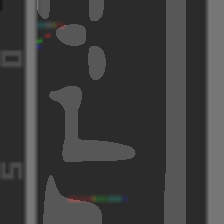
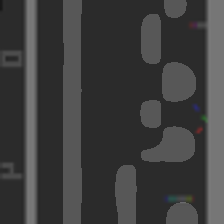
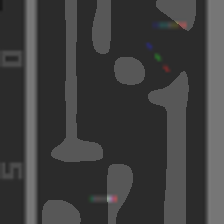
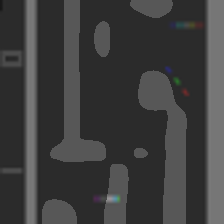
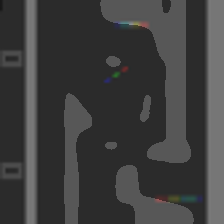
...
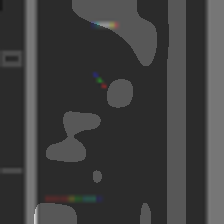
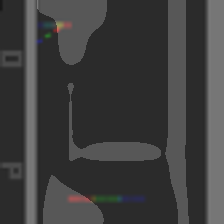
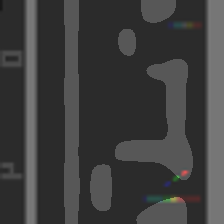
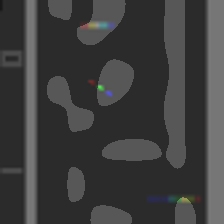
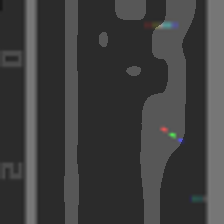

In [22]:
def dissect_unit(ds, i, net, layer, unit):
    data = ds[i]
    im = np.einsum( 'ijk->jki', data[:3])
    im = (im*255).astype(np.uint8)
    im = resize_and_crop(Image.fromarray(im), size)
    state = torch.tensor([data],dtype=torch.float).to('cuda')
    with Trace(net, layer) as tr:
        net(state)
    mask = rgb_threshold(tr.output[0, unit].detach().cpu(), size=224)
#     img = renormalize.as_image(data, source=ds)
    return overlay_threshold(im, mask)


neuron = 18
layer = 'conv2'
scores = []
for imagenum, observation in enumerate(pbar(frames)):
    with Trace(model, layer) as tr:
        im = np.einsum( 'ijk->jki', observation[:3])
        im = (im*255).astype(np.uint8)
        im = resize_and_crop(Image.fromarray(im), size)
        state = torch.tensor([observation],dtype=torch.float).to('cuda')
        preds = model(state)
    score = tr.output[0, neuron].view(-1).max()
    scores.append((score, imagenum))
scores.sort(reverse=True)

show(f'{layer} neuron {neuron}',
     [[dissect_unit(frames, scores[i][1], model, layer, neuron) for i in range(12)]])

# Smooth Grad-CAM
Since neural networks are differentiable, it is natural to try to visualize them using gradients.

One simple method is smoothgrad (Smilkov 2017), which examines gradients of perturbed inputs.

https://arxiv.org/pdf/1706.03825.pdf

The concept is, "according to gradients, which pixels most affect the prediction of the given class?"

Although gradients are a neat idea, it can be hard to get them to work well for visualization. See Adebayo 2018

https://arxiv.org/pdf/1810.03292.pdf

ACTION: 4



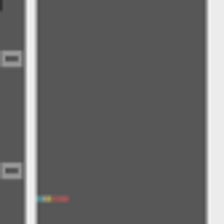
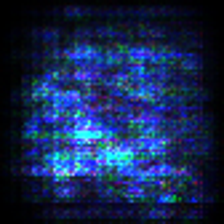
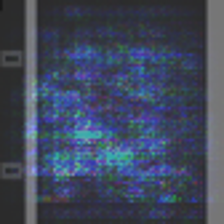

ACTION: 1



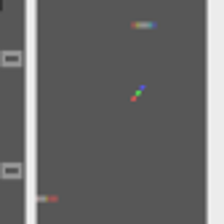
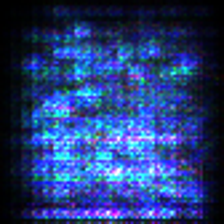
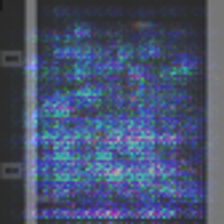

ACTION: 5



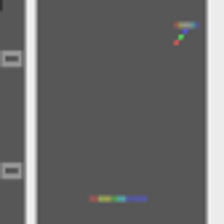
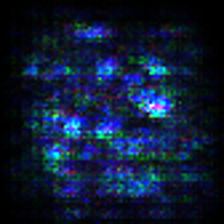
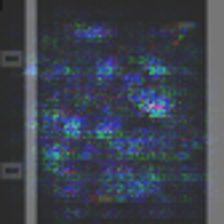

ACTION: 2



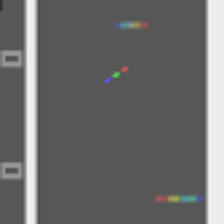
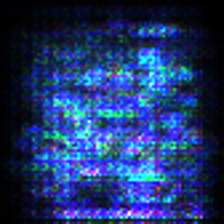
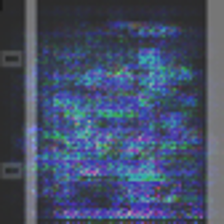

ACTION: 5



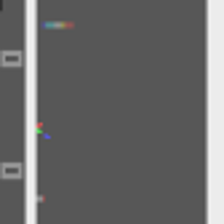
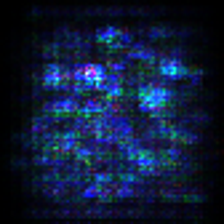
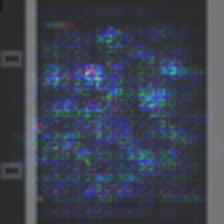

ACTION: 5



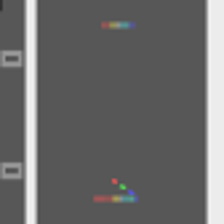
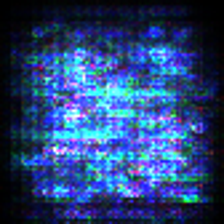
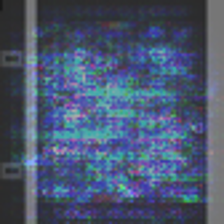

ACTION: 2



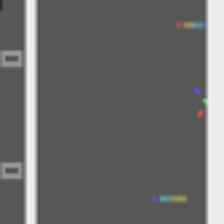
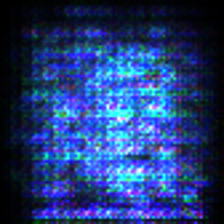
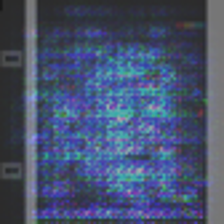

ACTION: 3



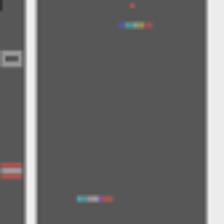
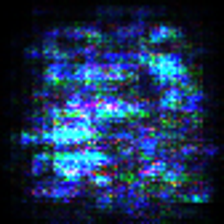
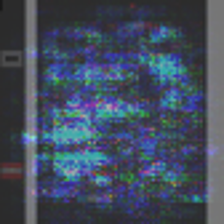

ACTION: 4



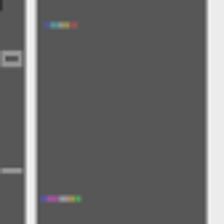
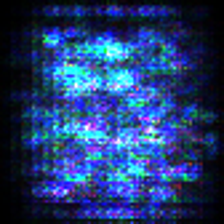
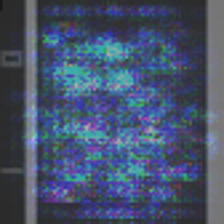

ACTION: 3



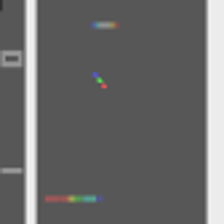
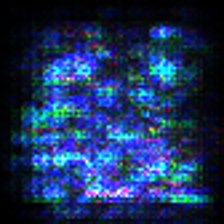
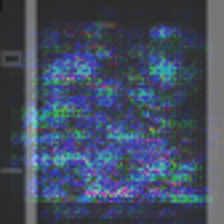

ACTION: 5



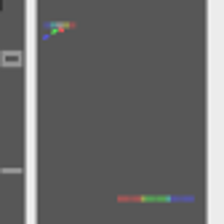
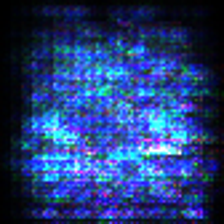
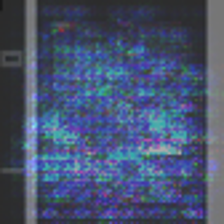

ACTION: 3



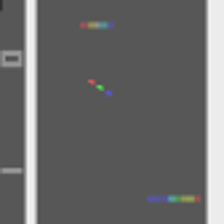
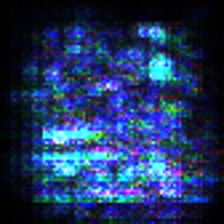
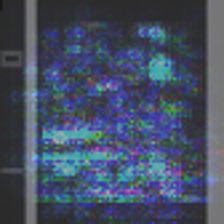

ACTION: 1



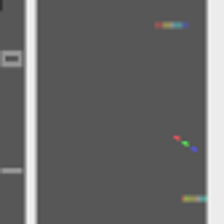
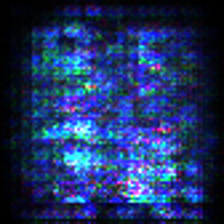
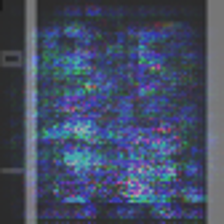

ACTION: 3



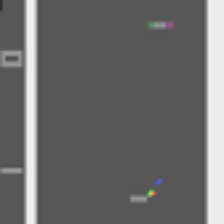
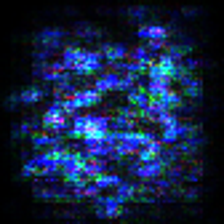
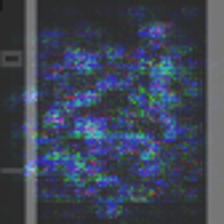

ACTION: 2



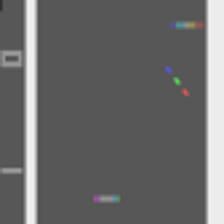
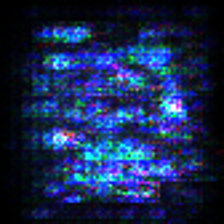
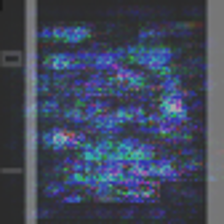

ACTION: 2



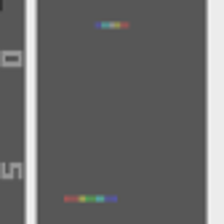
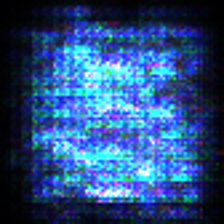
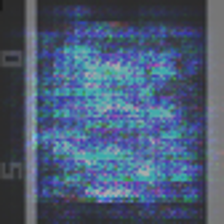

ACTION: 2



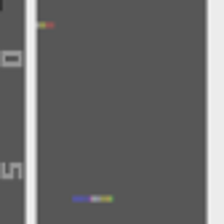
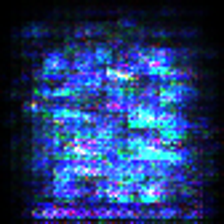
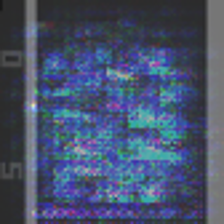

ACTION: 2



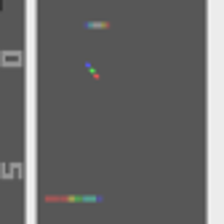
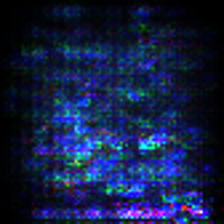
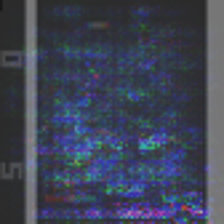

ACTION: 3



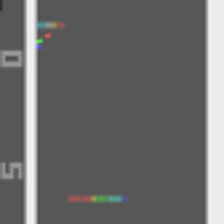
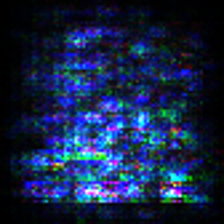
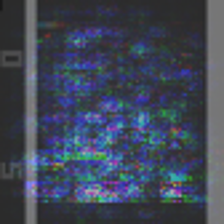

ACTION: 3



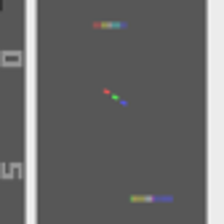
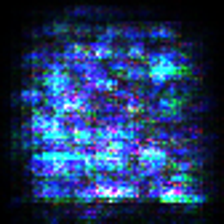
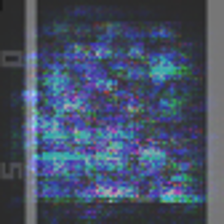

ACTION: 2



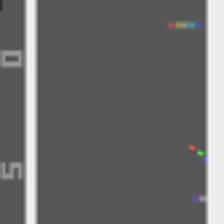
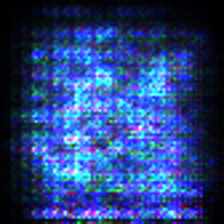
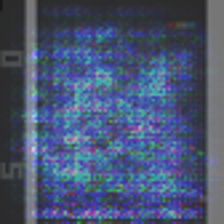

ACTION: 2



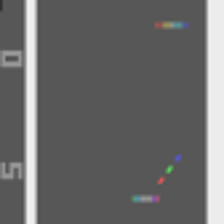
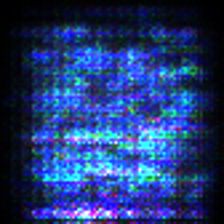
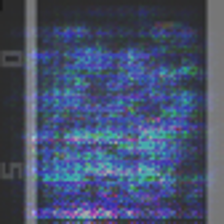

ACTION: 4



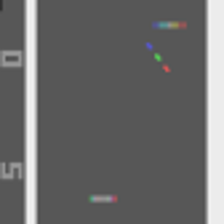
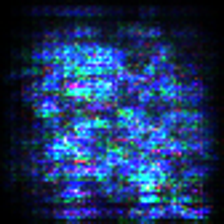
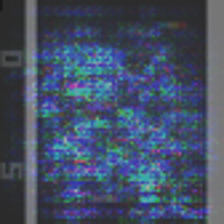

ACTION: 3



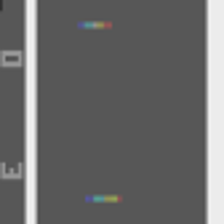
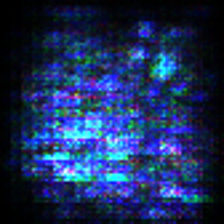
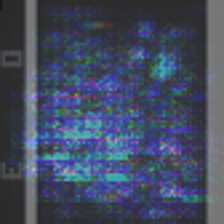

ACTION: 2



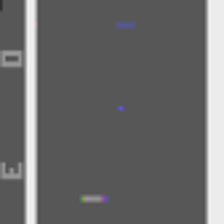
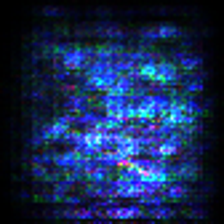
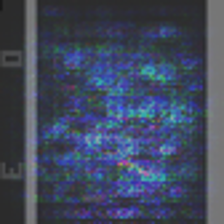

ACTION: 3



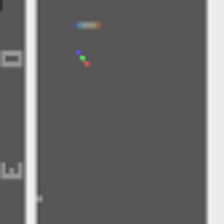
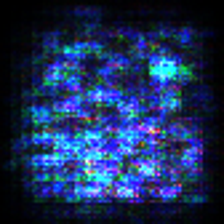
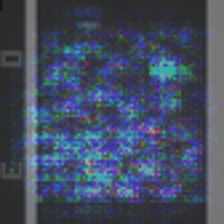

ACTION: 5



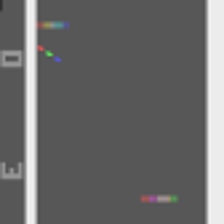
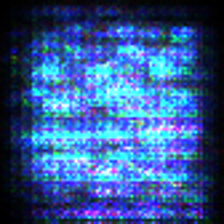
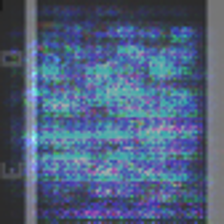

ACTION: 5



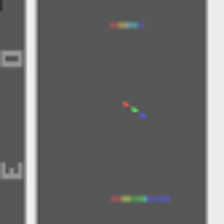
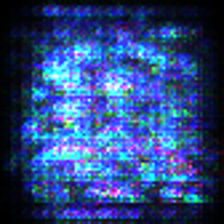
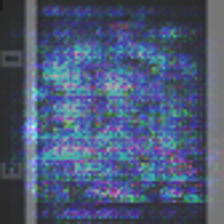

ACTION: 2



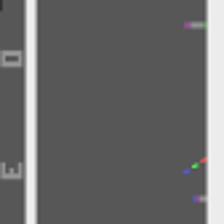
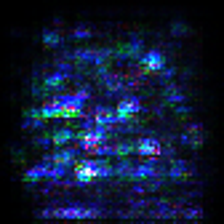
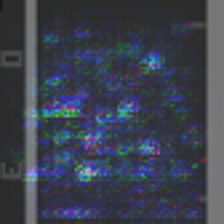

ACTION: 2



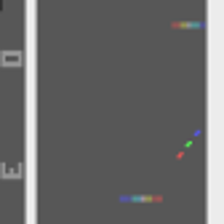
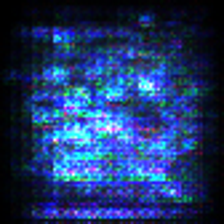
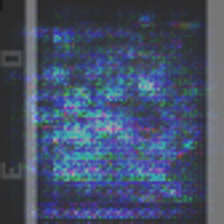

ACTION: 3



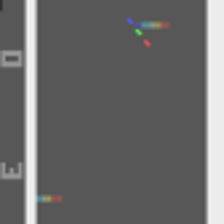
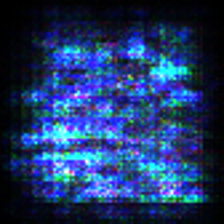
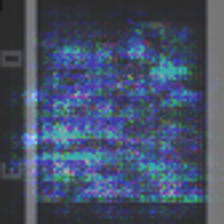

ACTION: 4



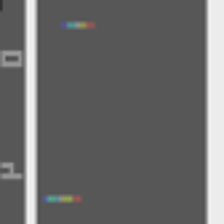
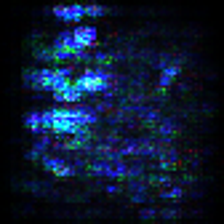
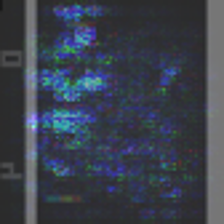

ACTION: 3



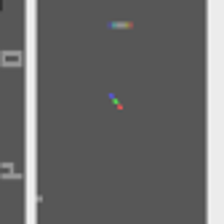
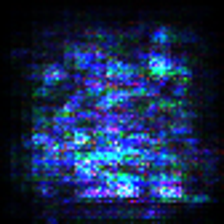
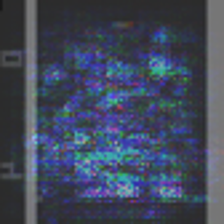

ACTION: 3



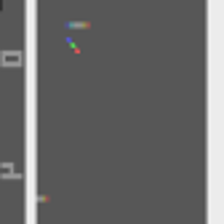
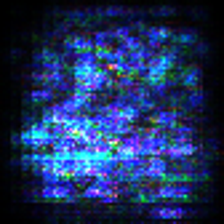
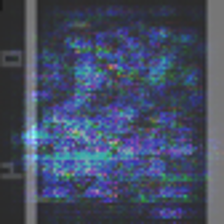

ACTION: 3



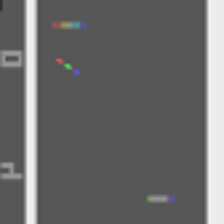
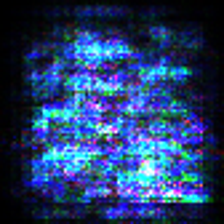
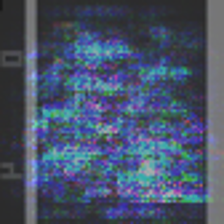

ACTION: 3



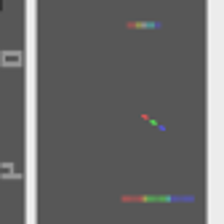
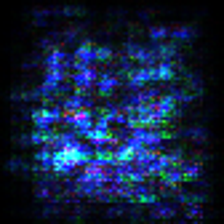
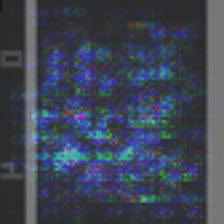

ACTION: 1



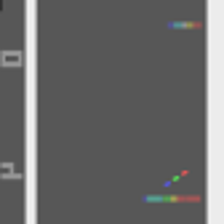
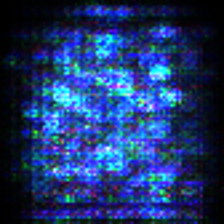
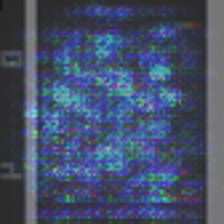

ACTION: 2



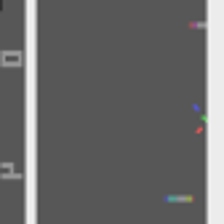
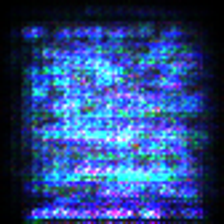
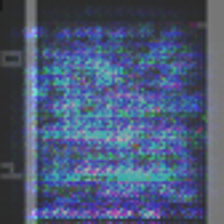

ACTION: 3



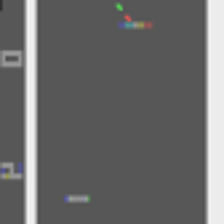
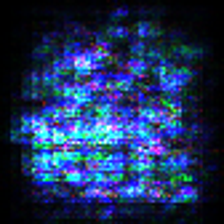
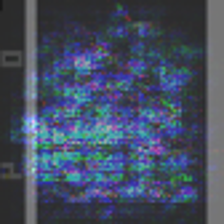

ACTION: 5



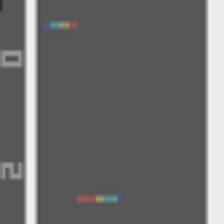
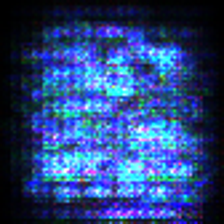
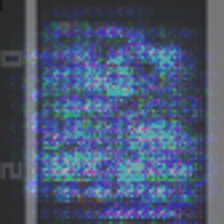

ACTION: 3



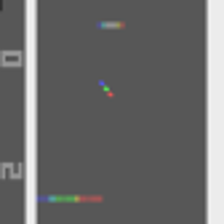
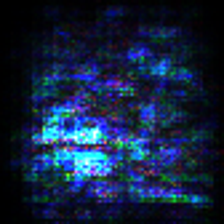
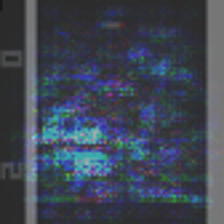

ACTION: 5



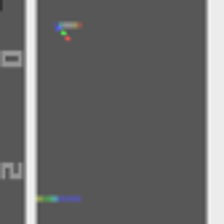
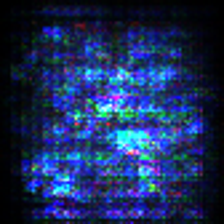
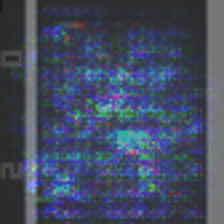

ACTION: 1



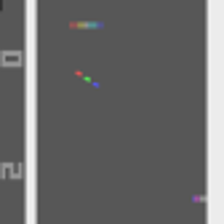
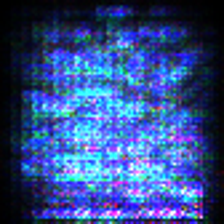
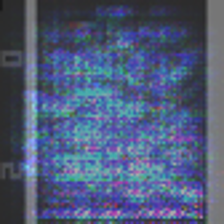

ACTION: 1



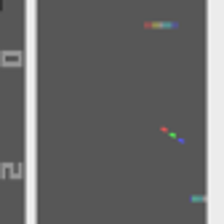
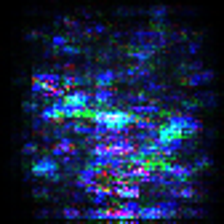
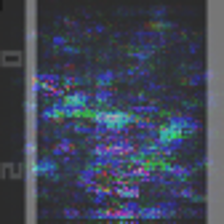

ACTION: 4



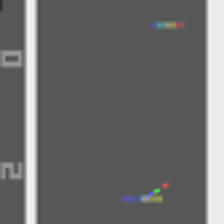
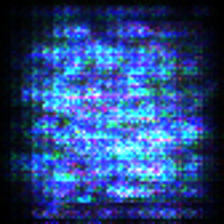
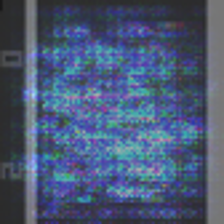

ACTION: 4



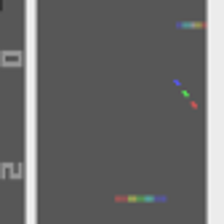
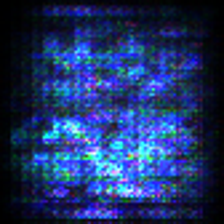
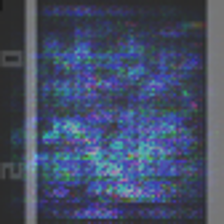

ACTION: 2



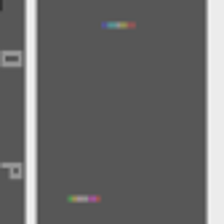
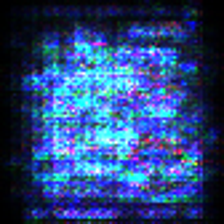
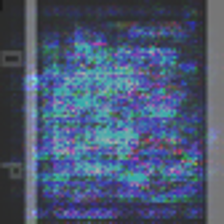

ACTION: 2



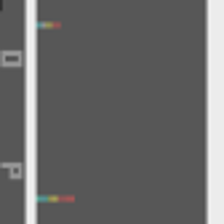
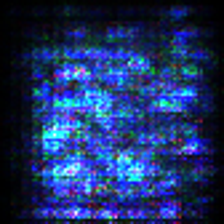
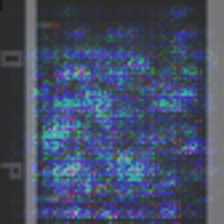

ACTION: 1



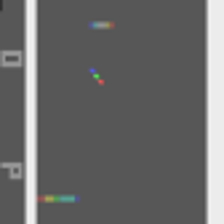
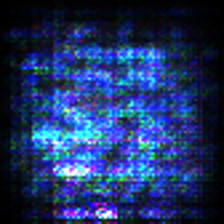
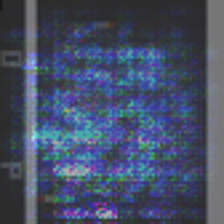

ACTION: 2



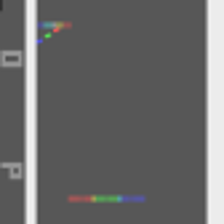
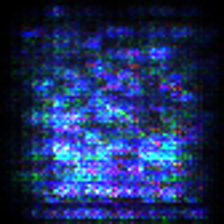
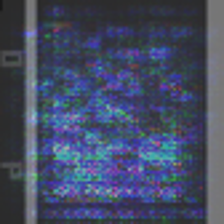

In [20]:
size = 224

for observation in frames:
# observation = frames[4]
    with torch.no_grad():
        im = np.einsum( 'ijk->jki', observation[:3])
        im = (im*255).astype(np.uint8)
        im = resize_and_crop(Image.fromarray(im), size)
        state = torch.tensor([observation],dtype=torch.float)
        preds = model(state.to('cuda'))
        print(f'ACTION: {preds.argmax().item()}')
        label = preds.argmax().item()
    total = 0
    for i in range(30):
        im = np.einsum( 'ijk->jki', observation[:3])
        im = (im*255).astype(np.uint8)
        im = resize_and_crop(Image.fromarray(im), size)
        state = torch.tensor([observation],dtype=torch.float)

        prober = state + torch.randn(state.shape) 
        prober.requires_grad = True
        loss = torch.nn.functional.cross_entropy(
            model(prober.to('cuda')),
            torch.tensor([label]).to('cuda'))
        loss.backward()

        gradient = prober.grad # TO-DO (Replace None with the gradient wrt to the perturbed input)

        total += gradient**2
        prober.grad = None
    camoutput = renormalize.as_image((total / total.max() * 5).clamp(0, 1)[0][1:], source='pt')

    camoutput = resize_and_crop(camoutput, size)
    show(show.TIGHT, [[
        [f'state | action {action_space[label]}',
        im],
        ['gradCAM',
        camoutput],
        ['overlay',
         overlay(im, camoutput)]]])
    del prober